In [1]:
from math import gcd
import numpy
from numpy import array, zeros, ones, arange, log2, sqrt, diff, concatenate
from scipy.stats import norm
from scipy.signal import argrelextrema, detrend

import matplotlib.pyplot as plt

In [6]:
# First, we compute a set of numerator/denominator pairs that are coprime
numerators = []
denominators = []
# N = 420
N = 100
for den in range(1, N):
    for num in range(1, 3 * den):
        if gcd(num, den) == 1:
            numerators.append(num)
            denominators.append(den)
numerators = array(numerators)
denominators = array(denominators)

ratios = numerators / denominators
bendetti_heights = numerators * denominators
tenney_heights = log2(bendetti_heights)

ind = numpy.argsort(tenney_heights)  # first, sort by Tenney height to make things more efficient
bendetti_heights = bendetti_heights[ind]
tenney_heights = tenney_heights[ind]
numerators = numerators[ind]
denominators = denominators[ind]
ratios = ratios[ind]

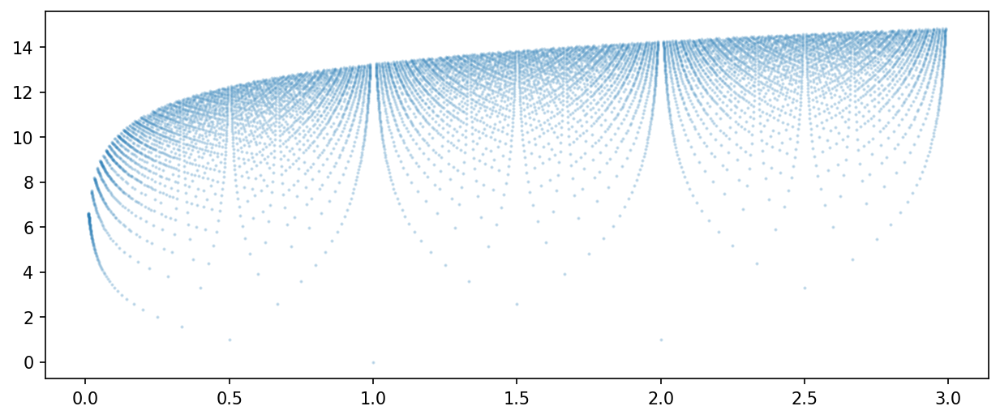

In [7]:
fig = plt.figure(figsize=(10, 4), dpi=150)
ax = fig.add_subplot(111)
# ax.scatter(ratios, 2**tenney_heights, s=1)
ax.scatter(ratios, tenney_heights, s=1, alpha=.2)
# ax.scatter(ratios[:200], tenney_heights[:200], s=1, color='r')
plt.show()

$$
\frac{n}{d}
$$

$$
T = \log_2(n \cdot d)
$$

$$
2^T = n \cdot d
$$

In [8]:
# Next, we need to ensure a distance `d` between adjacent ratios
M = len(bendetti_heights)
print(M)

delta = 0.00001
indices = ones(M, dtype=bool)

for i in range(M - 2):
    ind = abs(ratios[i + 1:] - ratios[i]) > delta
    indices[i + 1:] = indices[i + 1:] * ind
    
bendetti_heights = bendetti_heights[indices]
tenney_heights = tenney_heights[indices]
numerators = numerators[indices]
denominators = denominators[indices]
ratios = ratios[indices]
M = len(tenney_heights)
print(M)

9011
9011


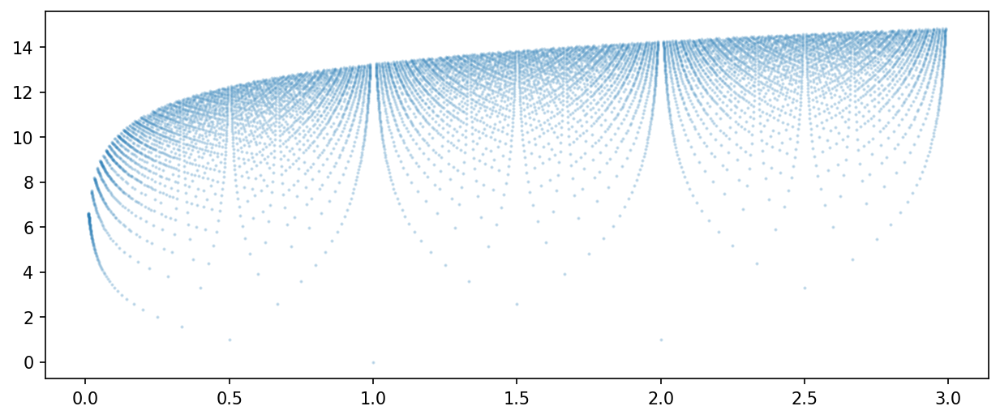

In [9]:
fig = plt.figure(figsize=(10, 4), dpi=150)
ax = fig.add_subplot(111)
# ax.scatter(ratios, 2**tenney_heights, s=5)
ax.scatter(ratios, tenney_heights, s=1, alpha=.2)
# ax.bar(ratios - delta, tenney_heights, 2 * delta, alpha=.5)
# ax.set_ylim(-1, 15)
# ax.set_xlim(1.8, 2.2)
plt.show()

In [10]:
# Now we need everything sorted by ratio
ind = numpy.argsort(ratios)
weight_ratios = ratios[ind]

centers = (weight_ratios[:-1] + weight_ratios[1:]) / 2
spread = 0.02
x = 1.4
pdf = diff(concatenate(([0], norm.cdf(log2(centers), loc=log2(x), scale=spread), [1])))

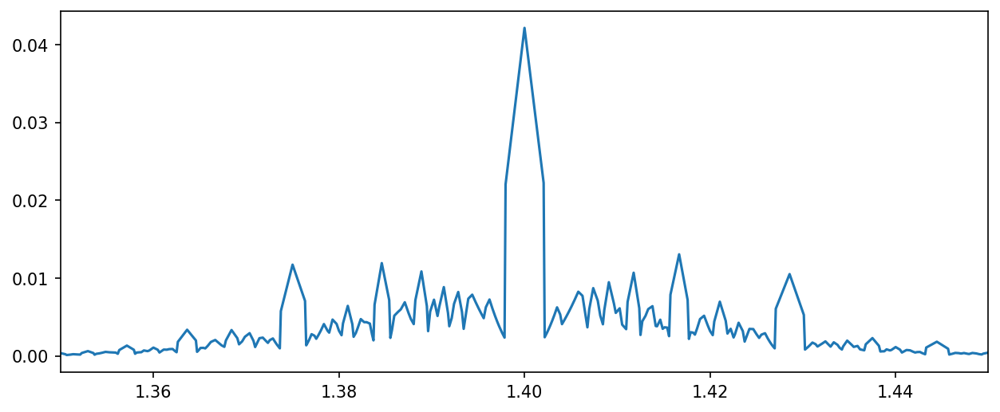

In [11]:
fig = plt.figure(figsize=(10, 4), dpi=150)
ax = fig.add_subplot(111)
# ax.plot(weight_ratios, log2(pdf))
ax.plot(weight_ratios, pdf)
# ax.bar(ratios - delta, weights, 2 * delta, alpha=.5)
# ax.set_ylim(-1, 15)
ax.set_xlim(1.35, 1.45)
plt.show()

In [12]:
from numpy import sqrt, sin, pi, log2
from numpy.random import randn
from numpy.fft import fft, ifft, fftfreq
from IPython.display import Audio

In [13]:
import matplotlib.pyplot as plt

In [15]:
RATE = 44100
T = 120
N = T * RATE
t = arange(N) / RATE

f0 = 500
f_pdf = weight_ratios * f0
f_pdf2 = weight_ratios * f0 / 1.4

f = fftfreq(N, d=1 / RATE)

H_filt = numpy.interp(f, f_pdf, pdf, 0, 0)
# H_filt[abs(H_filt) < 0.001] = 0
# H_filt[abs(H_filt) > 0.001] = 0
H_rand = (randn(N) + 1j * randn(N)) / sqrt(2)
data = ifft(H_rand * H_filt).real * N

# H_filt2 = numpy.interp(f, f_pdf2, pdf, 0, 0)
# H_rand = (randn(N) + 1j * randn(N)) / sqrt(2)
# data += ifft(H_rand * H_filt2).real * N

In [16]:
Audio(data=data, rate=44100, autoplay=True)

In [17]:
def compute_harmonic_entropy_domain_integral(ratios, ratio_interval, spread=0.01, min_tol=1e-15):
    
    # The first step is to pre-sort the ratios to speed up computation
    ind = numpy.argsort(ratios)
    weight_ratios = ratios[ind]
    
    centers = (weight_ratios[:-1] + weight_ratios[1:]) / 2
    
    ratio_interval = array(ratio_interval)
    N = len(ratio_interval)
    HE = zeros(N)
    for i, x in enumerate(ratio_interval):
        P = diff(concatenate(([0], norm.cdf(log2(centers), loc=log2(x), scale=spread), [1])))
        ind = P > min_tol
        HE[i] = -numpy.sum(P[ind] * log2(P[ind]))
    
    return weight_ratios, HE

In [18]:
def compute_harmonic_entropy_simple_weights(numerators, denominators, ratio_interval, spread=0.01, min_tol=1e-15):
    
    # The first step is to pre-sort the ratios to speed up computation
    ratios = numerators / denominators
    ind = numpy.argsort(ratios)
    numerators = numerators[ind]
    denominators = denominators[ind]
    weight_ratios = ratios[ind]
    
    ratio_interval = array(ratio_interval)
    N = len(ratio_interval)
    HE = zeros(N)
    for i, x in enumerate(ratio_interval):
        P = norm.pdf(log2(weight_ratios), loc=log2(x), scale=spread) / sqrt(numerators * denominators)
        ind = P > min_tol
        P = P[ind]
        P /= numpy.sum(P)
        HE[i] = -numpy.sum(P * log2(P))
    
    return weight_ratios, HE

In [19]:
x_ratios = arange(0.5, 2.5, 0.001)
_, HE = compute_harmonic_entropy_domain_integral(ratios, x_ratios, spread=0.005)
# _, HE_simple = compute_harmonic_entropy_simple_weights(numerators, denominators, x_ratios, spread=0.001)

In [20]:
# ind = argrelextrema(HE_simple, numpy.less)
# HE_minima = (x_ratios[ind], HE_simple[ind])
ind = argrelextrema(HE, numpy.less)
HE_minima = (x_ratios[ind], HE[ind])

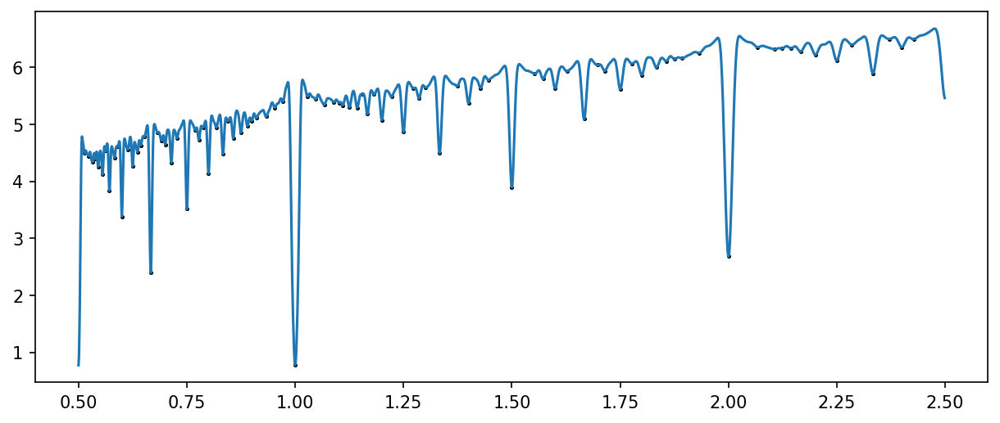

In [21]:
fig = plt.figure(figsize=(10, 4), dpi=150)
ax = fig.add_subplot(111)
# ax.plot(weight_ratios, log2(pdf))
ax.plot(x_ratios, HE)
# ax.plot(x_ratios, HE_simple)
ax.scatter(HE_minima[0], HE_minima[1], color='k', s=2)
# ax.set_xlim(1.35, 1.45)
plt.show()

In [22]:
def compute_average_tenney_height(numerators, denominators, ratio_interval, spread=0.01, min_tol=1e-15):
    
    # The first step is to pre-sort the ratios to speed up computation
    ratios = numerators / denominators
    ind = numpy.argsort(ratios)
    weight_ratios = ratios[ind]
    bendetti_heights = numerators[ind] * denominators[ind]
    tenney_heights = log2(bendetti_heights)
    
    centers = (weight_ratios[:-1] + weight_ratios[1:]) / 2
    
    ratio_interval = array(ratio_interval)
    N = len(ratio_interval)
    ave_height = zeros(N)
    for i, x in enumerate(ratio_interval):
        P = diff(concatenate(([0], norm.cdf((centers), loc=(x), scale=spread), [1])))
        ind = P > min_tol
        P = P[ind]
        P /= numpy.sum(P)
        ave_height[i] = numpy.sum(P * tenney_heights[ind])
    
    return weight_ratios, ave_height

In [23]:
_, ave_tenn_height = compute_average_tenney_height(numerators, denominators, x_ratios, spread=0.01)

In [24]:
concordant_ratios = []
for i in ind[0]:
    if 1 < x_ratios[i] < 2:
        concordant_ratios.append(x_ratios[i])
print('[' + ', '.join(['{0:3.5f}'.format(x) for x in concordant_ratios]) + ']')

[1.00000, 1.02900, 1.04700, 1.06700, 1.08900, 1.10100, 1.11000, 1.12500, 1.14300, 1.15400, 1.16700, 1.18200, 1.20000, 1.22200, 1.25000, 1.27300, 1.28600, 1.30100, 1.33300, 1.37400, 1.40000, 1.42800, 1.44600, 1.50000, 1.55300, 1.57200, 1.60000, 1.62700, 1.66700, 1.69700, 1.71400, 1.75000, 1.77700, 1.80000, 1.83400, 1.85600, 1.87600, 1.89200, 1.93200]


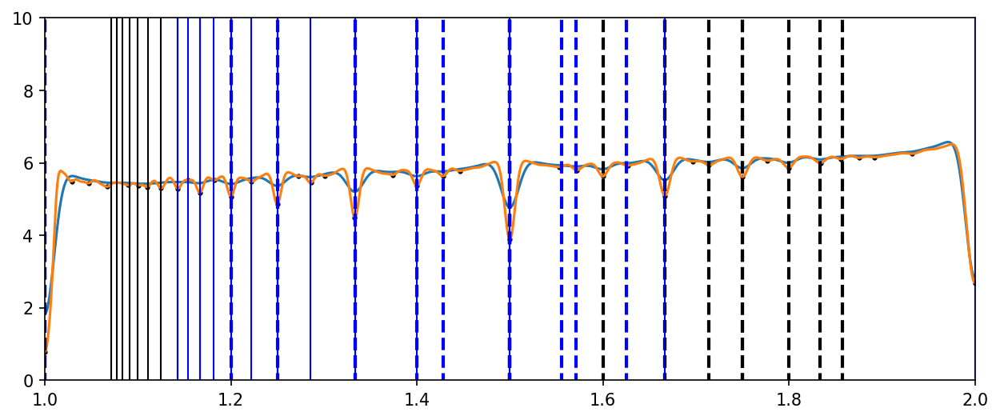

In [30]:
fig = plt.figure(figsize=(10, 4), dpi=150)
ax = fig.add_subplot(111)
ax.plot(x_ratios, ave_tenn_height - 6)
ax.plot(x_ratios, HE)
# ax.plot(x_ratios, detrend(ave_bend_height))
# _ind = HE_minima[1] < 9
ax.scatter(HE_minima[0], HE_minima[1], color='k', s=4)
for n in range(2, 15):
    d = n // 2 + 1
    r = n / d
    ax.plot((r, r), (-10000, 10000), color='k', linewidth=2, linestyle='--')
for n in range(2, 15):
    d = n // 2 + 2
    r = n / d
    ax.plot((r, r), (-10000, 10000), color='b', linewidth=2, linestyle='--')
for d in range(2, 15):
    n = d + 1
    r = n / d
    ax.plot((r, r), (-10000, 10000), color='k', linewidth=1)
for d in range(2, 15):
    n = d + 2
    r = n / d
    ax.plot((r, r), (-10000, 10000), color='b', linewidth=1)
# for d in range(2, 12):
#     n = d + 1
#     r = n / d
#     ax.plot((r, r), (-10000, 10000), color='k', linewidth=2)
#     n = d + 2
#     r = n / d
#     ax.plot((r, r), (-10000, 10000), color='g', linewidth=1)
#     n = d + 3
#     r = n / d
#     ax.plot((r, r), (-10000, 10000), color='r', linewidth=1)
#     n = d + 4
#     r = n / d
#     ax.plot((r, r), (-10000, 10000), color='b', linewidth=1)
# ax.set_xlim(1.35, 1.45)
ax.set_xlim(1, 2)
ax.set_ylim(0, 10)
plt.show()

We now have the the harmonic entropy curve $H(r)$ over interval ratios $r = \frac{n}{d}$.  The question is, starting at some ratio $r_0$, can we find all the triads with low harmonic entropy between all three ratios?  And, do these triads sound nice?  After, that, is there a way to extend to 4 ratios?

In [31]:
from numpy import nan

In [32]:
HE_triad = nan * zeros((x_ratios.size,) * 2)
for i, r0 in enumerate(x_ratios):
    y_ratios = x_ratios / r0
    HE_triad[:, i] = HE[i] * HE * numpy.interp(y_ratios, x_ratios, HE, numpy.nan, numpy.nan)
HE_triad = (HE_triad + HE_triad.T) / 2

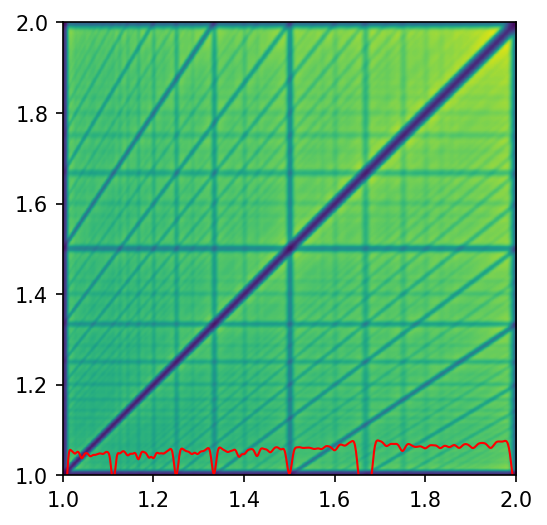

In [34]:
fig = plt.figure(figsize=(4, 4), dpi=150)
ax = fig.add_subplot(111)
extent = x_ratios[[0, -1, 0, -1]]
# ax.imshow(HE_triad, extent=extent, origin='lower', interpolation='nearest', vmin=700, vmax=1000)
ax.imshow(HE_triad, extent=extent, origin='lower', interpolation='nearest')

i = numpy.searchsorted(x_ratios, 5 / 3)
ax.plot(x_ratios, HE_triad[i, :] / 1000 + 0.9, color='r', linewidth=1)

ax.set_xlim(1, 2)
ax.set_ylim(1, 2)
# ax.set_xlim(0, )
# ax.set_xlim(1.5, 1.7)
# ax.set_ylim(1.4, 1.6)
plt.show()

1000


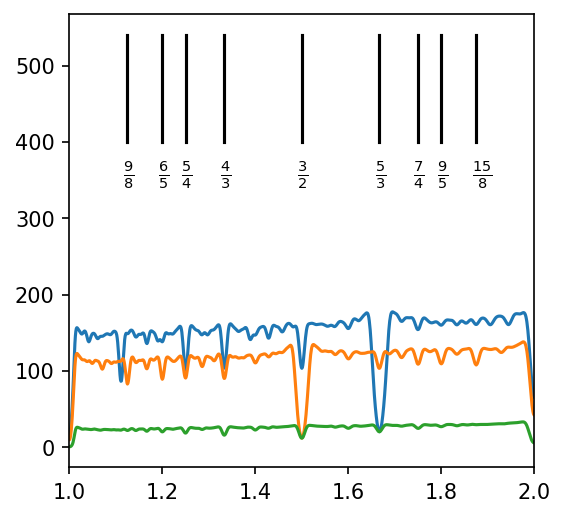

In [35]:
fig = plt.figure(figsize=(4, 4), dpi=150)
ax = fig.add_subplot(111)
extent = x_ratios[[0, -1, 0, -1]]
i = numpy.searchsorted(x_ratios, 5 / 3)
ax.plot(x_ratios, HE_triad[i, :])
i = numpy.searchsorted(x_ratios, 1.5)
print(i)
# ax.plot(x_ratios[[0, -1]], x_ratios[[i, i]], color='r')
ax.plot(x_ratios, HE_triad[i, :])
ax.plot(x_ratios, HE_triad[numpy.diag_indices(HE_triad.shape[0])])
# for ratio in [9 / 8, 6 / 5, 5 / 4, 4 / 3, 3 / 2, 5 / 3, 7 / 4, 9 / 5, 15 / 8]:
for ratio in [(9, 8), (6, 5), (5, 4), (4, 3), (3, 2), (5, 3), (7, 4), (9, 5), (15, 8)]:
    r = ratio[0] / ratio[1]
    ax.plot((r,) * 2, [400, 540], color='k')
    ax.text(r - .01, 350, r'$\frac{' + '{0}'.format(ratio[0]) + '}{' + '{0}'.format(ratio[1]) + '}$')
#     ax.text()
ax.set_xlim(1, 2)
plt.show()

In [36]:
# 400 /6378
gps_raw = 1 + 5 + 25 + 250 + 0 + 5e3 + 25e3 + 250e3 + 75e6
gps_mult = 1.05 * 1.1 * 1.5 * 1.01
gps_mage = 1.2375
# gps = 165.821e6
gps = gps_raw * gps_mult * gps_mage
print(gps_raw, gps_mult, gps_mage, gps / 1e6)

print(750e9 / gps)
print(750e9 / (gps * 1.04))
print(900e9 / 2.5e9)

75280281.0 1.7498250000000004 1.2375 163.012555654771
4600.872595288639
4423.9159570083075
360.0


/home/brianbreitsch/anaconda3/lib/python3.7/site-packages/scipy/signal/_peak_finding.py:77: RuntimeWarning: invalid value encountered in less
  results &= comparator(main, plus)
/home/brianbreitsch/anaconda3/lib/python3.7/site-packages/scipy/signal/_peak_finding.py:78: RuntimeWarning: invalid value encountered in less
  results &= comparator(main, minus)


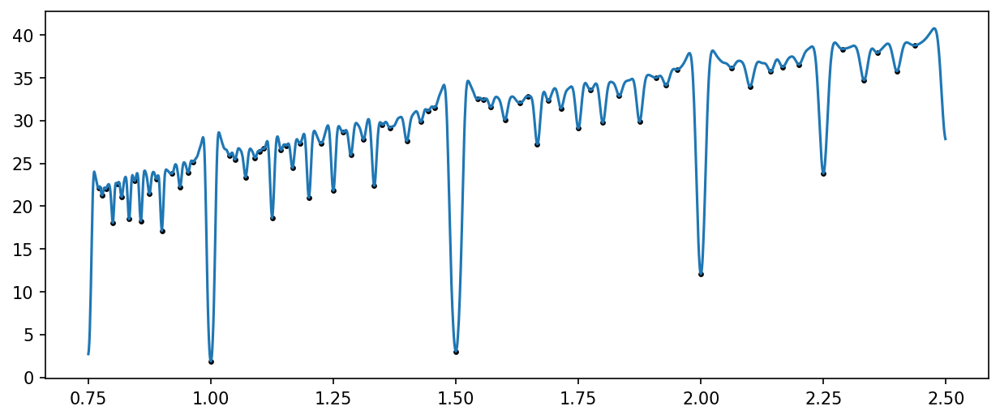

In [37]:
fig = plt.figure(figsize=(10, 4), dpi=150)
ax = fig.add_subplot(111)
r0 = 1.5
y_ratios = x_ratios / r0
HE_y = numpy.interp(y_ratios, x_ratios, HE, numpy.nan, numpy.nan)
HE_triad = HE * HE_y
ind = argrelextrema(HE_triad, numpy.less)
HE_triad_minima = (x_ratios[ind], HE_triad[ind])
ax.plot(x_ratios, HE_triad)
ax.scatter(HE_triad_minima[0], HE_triad_minima[1], color='k', s=5)
plt.show()